<a href="https://colab.research.google.com/github/RaphaelHaddad/KaggleCentraleSupelec/blob/main/Waste_detection_model_light.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Path

In [9]:
while True:pass

KeyboardInterrupt: ignored

In [1]:
import json
import os
import requests
from PIL import Image
import sys
from io import BytesIO


In [2]:
###########################################################
MAIN_FOLDER_PATH = "/content/drive/MyDrive/Infosys/waste_detection_light"  # Directory where you will save all your project
MODEL_NAME = "faster_rcnn_resnet101_v1_640x640_coco17_tpu-8" # Model name that you choose : 
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md
###########################################################


RESEARCH_DIR, CUSTOM_TF2_DIR = MAIN_FOLDER_PATH + "/model/research", MAIN_FOLDER_PATH + "/customTF2"
PROTOR_DIR = RESEARCH_DIR + "/object_detection/protos"
PROTOC_PATH, SETUP_TF2_PATH = RESEARCH_DIR + "/object_detection/protos/*.proto", RESEARCH_DIR + "/object_detection/packages/tf2/setup.py"
DATA_DIR = MAIN_FOLDER_PATH + "/customTF2/data"
INSTALLATION_TEST_PATH = RESEARCH_DIR + "/object_detection/builders/model_builder_tf2_test.py"

IMAGES_DIR, TACO_RAW_DIR = DATA_DIR + "/images", DATA_DIR + "/taco_raw"
TACO_ZIP_PATH = MAIN_FOLDER_PATH + "/TACO.zip"
NUMBER_BATCH_TEST = [7, 2]                                      # Batch you choose for test
NUMBER_BATCH_MAX = 9                                           # Reduce if you want to ease the RAM
ANNOTATION_DIR = DATA_DIR + "/annotations"
TACO_ANNOTATIONS_PATH = ANNOTATION_DIR + "/annotations.json"
TRAIN_ANNOTATION_PATH, TEST_ANNOTATION_PATH = ANNOTATION_DIR + "/train.json", ANNOTATION_DIR + "/test.json"
CREATE_TF_RECORD_PATH = MAIN_FOLDER_PATH + "/create_coco_tf_record.py"
TF_RECORD_DIR = DATA_DIR + "/TF_records"

LABEL_MAP_PATH = DATA_DIR + "/label_map.pbtxt"
PIPELINE_CONFIG_2_PATH = DATA_DIR + "/" + MODEL_NAME + "/pipeline.config" 

MODEL_MAIN_FUNCTION_PATH = RESEARCH_DIR + "/object_detection/model_main_tf2.py"
PIPELINE_CONFIG_PATH = RESEARCH_DIR + "/object_detection/configs/tf2/" + MODEL_NAME + ".config"
TRAINING_DIR = MAIN_FOLDER_PATH + "/customTF2/training"
TRAINING_TRAIN_DIR = TRAINING_DIR + "/train"
TRAINING_EVAL_DIR = TRAINING_DIR + "/eval"
CHECKPOINT_CKPT_DIR = DATA_DIR + "/" + MODEL_NAME + "/checkpoint/ckpt-0"
NUMBER_OF_CLASSES, TRAIN_BATCH_SIZE, TEST_BATCH_SIZE = 60, 2, 2                                   # Decrease Batch size to ease the GPU and RAM
TF_RECORD_TRAIN_PATH, TF_RECORD_TEST_PATH = TF_RECORD_DIR + "/train.record", TF_RECORD_DIR + "/test.record"

MIN_NUMBER_IMAGE_PER_BATCH = 90


# Clone the TensorFlow model Zoo git repo + Install Object detection API

In [ ]:
# Only if you need drive on Google Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Clone model zoo model
!git clone --q https://github.com/tensorflow/models.git {MAIN_FOLDER_PATH + "/model/"}

In [6]:
## Setup the object detection Tensorflow API
%cd {RESEARCH_DIR}
!protoc object_detection/protos/*.proto --python_out=.

## The setup installation can take time or be stuck with some Python version
# If it's stuck, stop the cell and run it again
!cp {SETUP_TF2_PATH} {RESEARCH_DIR}
!python -m pip install {RESEARCH_DIR}

/content/drive/MyDrive/Infosys/waste_detection_light/model/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/drive/MyDrive/Infosys/waste_detection_light/model/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 11.0 MB 8.4 MB/s 
     |████████████████████████████████| 352 kB 62.4 MB/s 
     |████████████████████████████████| 2.2 MB 45.2 MB/s 
     |████████████████████████████████| 25.0 MB 64.3 MB/s 
     |████████████████████████████████| 67 kB 6.3 MB/s 
     |████████████████████████████████| 116 kB 65.3 MB/s 
     |█████

In [ ]:
# Download the pretrained model zip, unzip it and remove the zip
http_link = "http://download.tensorflow.org/models/object_detection/tf2/20200711/" + MODEL_NAME + ".tar.gz"
!wget {http_link} -P {DATA_DIR}
!tar -xf {DATA_DIR + "/" + MODEL_NAME + ".tar.gz"} -C {DATA_DIR}
!rm {DATA_DIR + "/" + MODEL_NAME + ".tar.gz"}

In [ ]:
# Important : run the cell to test the installation
# the message in the console should finish with OK
!python {INSTALLATION_TEST_PATH}

# Data download, annotations and TF Records

In [ ]:
## Downloading the annotations file
!wget https://raw.githubusercontent.com/pedropro/TACO/master/data/annotations.json -P {ANNOTATION_DIR} # Download annotations
!mkdir {IMAGES_DIR}

## Function to download the dataset with this annotation file
## Can take several minutes (20 min in Infosys office)
with open(TACO_ANNOTATIONS_PATH, 'r') as f:
    annotations = json.loads(f.read())

    nr_images = len(annotations['images'])
    for i in range(nr_images):

        image = annotations['images'][i]

        file_name = image['file_name']
        url_original = image['flickr_url']
        url_resized = image['flickr_640_url']

        file_path = os.path.join(IMAGES_DIR, file_name)

        # Create subdir if necessary
        subdir = os.path.dirname(file_path)
        print
        if not os.path.isdir(subdir):
            os.mkdir(subdir)

        if not os.path.isfile(file_path):
            # Load and Save Image
            response = requests.get(url_original)
            img = Image.open(BytesIO(response.content))
            if img._getexif():
                img.save(file_path, exif=img.info["exif"])
            else:
                img.save(file_path)

        # Show loading bar
        bar_size = 30
        x = int(bar_size * i / nr_images)
        sys.stdout.write("%s[%s%s] - %i/%i\r" % ('Loading: ', "=" * x, "." * (bar_size - x), i, nr_images))
        sys.stdout.flush()
        i+=1

    sys.stdout.write('Finished\n')

In [ ]:
## Save annotations by splitting into train and test

def save_part_json(annotations_path, list_batch_number_to_keep) :

  id_to_keep = []
  with open(TACO_ANNOTATIONS_PATH) as annotation_file:
      annotation_dict = json.load(annotation_file)

  # Saving all the id we want to keep
  for image in annotation_dict['images'] :
    batch_str = image['file_name'].split("/")[0]
    batch_number = int(batch_str.split("_")[-1])
    if batch_number in list_batch_number_to_keep :
      id_to_keep.append(int(image['id']))

  annotation_dict["images"] = [element for element in annotation_dict['images'] if int(element["id"]) in id_to_keep]


  # Deleting all the id not in the list
  for annotation_key in ["annotations", "scene_annotations"] :
    annotation_dict[annotation_key] = [element for element in annotation_dict[annotation_key] if int(element["image_id"]) in id_to_keep]

  with open(annotations_path, "w") as outfile:
    json.dump(annotation_dict, outfile)


save_part_json(TEST_ANNOTATION_PATH, NUMBER_BATCH_TEST)
save_part_json(TRAIN_ANNOTATION_PATH, list( set( [i for i in range(1, NUMBER_BATCH_MAX + 1)] ) - set( NUMBER_BATCH_TEST ) ))


In [ ]:
# Creating TF Record using a function
# this cell download the function and run it on train and test json

if not os.path.exists(MAIN_FOLDER_PATH + "/create_coco_tf_record.py") :
  !wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/dataset_tools/create_coco_tf_record.py -P {MAIN_FOLDER_PATH}
if os.path.exists(TF_RECORD_DIR) :
  !rm -rf {TF_RECORD_DIR}
!mkdir {TF_RECORD_DIR}
command = "python {} --logtostderr --train_image_dir={} --val_image_dir={} --test_image_dir={} --train_annotations_file={} --testdev_annotations_file={} "\
                "--val_annotations_file={} --output_dir={}".format(CREATE_TF_RECORD_PATH, IMAGES_DIR, IMAGES_DIR, IMAGES_DIR, TRAIN_ANNOTATION_PATH, 
                                                                   TEST_ANNOTATION_PATH, TEST_ANNOTATION_PATH, TF_RECORD_DIR)
!{command}

2022-10-31 06:43:09.556030: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-31 06:43:09.748073: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 06:43:10.440861: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 06:43:10.441001: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cann

# Label Map and config file 

In [ ]:
# label Map creation using the annotations

with open(TACO_ANNOTATIONS_PATH) as annotation_file:
  dict_annotation = json.load(annotation_file)
classes = [dict_annotation["categories"][i]["name"] for i in range(len(dict_annotation["categories"]))]

pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(LABEL_MAP_PATH, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')

Successfully created label_map.pbtxt 


In [ ]:
## Automatically modify the pipeline config file
## Careful : could not work
## In this case, change the file by hand


from object_detection.protos import pipeline_pb2
import tensorflow as tf
from google.protobuf import text_format

pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(PIPELINE_CONFIG_PATH, "r") as f :
  proto_str = f.read()
  text_format.Merge(proto_str, pipeline_config)

pipeline_config.model.faster_rcnn.num_classes = NUMBER_OF_CLASSES
pipeline_config.train_config.fine_tune_checkpoint = CHECKPOINT_CKPT_DIR
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= LABEL_MAP_PATH
pipeline_config.eval_input_reader[0].label_map_path = LABEL_MAP_PATH
pipeline_config.train_config.batch_size = TRAIN_BATCH_SIZE
pipeline_config.eval_config.batch_size = TEST_BATCH_SIZE

train_record_list  = []
test_record_list  = []
for filename in os.listdir(TF_RECORD_DIR) :
  surname = (filename.split(".")[0]).split("_")[-1]
  if surname == 'train' :
    train_record_list.append(os.path.join(TF_RECORD_DIR, filename))
  if surname == 'testdev' :
    test_record_list.append(os.path.join(TF_RECORD_DIR, filename))
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = train_record_list
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = test_record_list

config_text = text_format.MessageToString(pipeline_config)
with tf.io.gfile.GFile(PIPELINE_CONFIG_PATH, "wb") as f :
  f.write(config_text)     
with tf.io.gfile.GFile(PIPELINE_CONFIG_2_PATH, "wb") as f :
  f.write(config_text)                                                                                                                                                                                                           



# Training and evaluating the model

In [11]:
## Directory with the checkpoint training
!mkdir {TRAINING_DIR}

In [12]:
## Directory with the checkpoint training
!mkdir {TRAINING_DIR}

## Run the training
## CAREFUL : Use GPU with lots of RAM if possible, can take hours
command = "python {} --pipeline_config_path={} --model_dir={} --alsologtostderr".format(MODEL_MAIN_FUNCTION_PATH, PIPELINE_CONFIG_PATH, EMPTY_TRAINING_DIR)
!{command}

mkdir: cannot create directory ‘/content/drive/MyDrive/Infosys/waste_detection_light/customTF2/training’: File exists
2022-11-02 05:33:35.428106: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-02 05:33:36.543676: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-02 05:33:38.653134: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-02 05:33:38.653781: W tensorflow/stream_executor/platform/default/ds

In [7]:
## Tensorboard to check the training at different steps, during the training
%load_ext tensorboard
%tensorboard --logdir {TRAINING_TRAIN_DIR}

<IPython.core.display.Javascript object>

# Testing the model

In [ ]:
# Restore of of the checkpoint
# Detection function
from object_detection.utils import config_util
from object_detection.builders import model_builder
from object_detection.utils import visualization_utils as viz_utils 
from object_detection.utils import label_map_util

import tensorflow as tf
tf.config.run_functions_eagerly(True)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
figure(figsize=(10, 6), dpi=80)
%matplotlib inline

import numpy as np
import cv2 
import random

CKPT_NUMBER = 19   # check in training dir the checkpoint you want to restore

configs = config_util.get_configs_from_pipeline_file(PIPELINE_CONFIG_PATH)
detection_model = model_builder.build(model_config=configs["model"], is_training=False)

ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(TRAINING_DIR, "ckpt-" + str(CKPT_NUMBER)))

@tf.function
def detect_fn(image):
  image, shapes = detection_model.preprocess(image)
  prediction_dict = detection_model.predict(image, shapes)
  detections = detection_model.postprocess(prediction_dict, shapes)
  return detections

<h3> Testing on TACO dataset

/content/drive/MyDrive/Infosys/waste_detection_light/customTF2/data/images/batch_5/000100.JPG


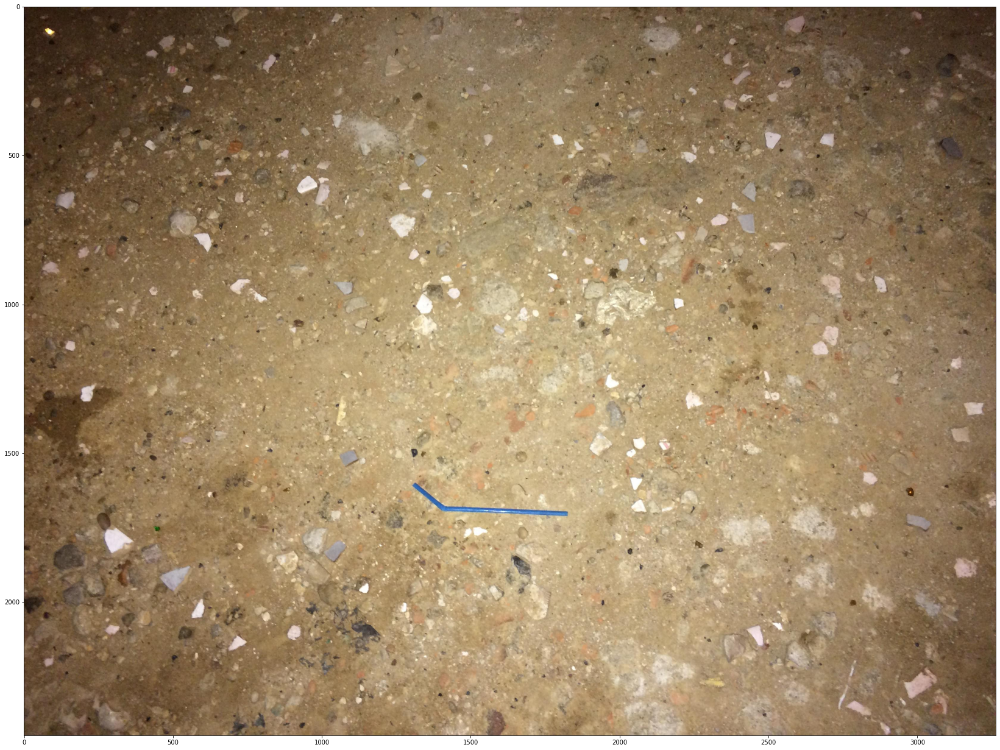

In [ ]:
# THe cell randomly choose one image from dataset
# and display the detection of the model

category_index = label_map_util.create_category_index_from_labelmap(LABEL_MAP_PATH)

# Choosing a random image
batch_number = random.randint(1, NUMBER_BATCH_MAX)
random_image_file = random.choice(os.listdir(os.path.join(IMAGES_DIR, "batch_"+ str(batch_number)))) 
TEST_IMAGE_PATH = os.path.join(IMAGES_DIR, "batch_"+ str(batch_number), random_image_file)
print(TEST_IMAGE_PATH)
img = cv2.imread(TEST_IMAGE_PATH)
image_np = np.array(img)
input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
detections = detect_fn(input_tensor)

num_detections = int(detections.pop("num_detections"))
detections = {key: value[0: num_detections].numpy() for key, value in detections.items()}
detections['num_detections'] = num_detections

detections['detection_classes'] = detections["detection_classes"].astype(np.int64)
label_id_offset = 1
image_np_with_detections = image_np.copy()

dc_boxes_shape = detections['detection_boxes'].shape
dc_classes_shape = detections['detection_classes'].shape
dc_scores_shape = detections['detection_scores'].shape

boxes = np.reshape(detections['detection_boxes'], (dc_boxes_shape[1], dc_boxes_shape[2]), order="C")
classes = np.reshape(detections['detection_classes'], (dc_classes_shape[1]), order="C") + label_id_offset
scores = np.reshape(detections['detection_scores'], (dc_scores_shape[1]), order="C")

viz_utils.visualize_boxes_and_labels_on_image_array(
            image = image_np_with_detections,
            boxes = boxes,
            classes = classes,
            scores = scores,
            category_index = category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=5,
            min_score_thresh=.8,
            agnostic_mode=False)

plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))
plt.gcf().set_size_inches(36, 22)
plt.show()


<h3> Test on custom video